# Imports

In [1]:
import pymysql
import pandas as pd


import matplotlib.pyplot as plt
import seaborn as sns

# from dotenv import load_dotenv
# from os import getenv

In [2]:
# load_dotenv(dotenv_path='.env')

# #change db to grocery_db, telcomarketing, insurance
# conn=pymysql.connect(host=getenv('HOST'),
#                      port=int(getenv('PORT')),
#                      user=getenv('DBUSER'),
#                      passwd=getenv('DBPASSWORD'),
#                      db='sakila')

# df= pd.read_sql("SELECT * FROM actor LIMIT 10",conn)
# df.head()

# #closes the connection with the server
# conn.close()
# df.to_csv('data.csv', index=False)

In [3]:
df = pd.read_csv('telco_data.csv')

# Exploratory Data Analysis

In [4]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False
3329,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False
3330,VT,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False
3331,WV,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   3333 non-null   object 
 1   Account length          3333 non-null   int64  
 2   Area code               3333 non-null   int64  
 3   International plan      3333 non-null   object 
 4   Voice mail plan         3333 non-null   object 
 5   Number vmail messages   3333 non-null   int64  
 6   Total day minutes       3333 non-null   float64
 7   Total day calls         3333 non-null   int64  
 8   Total day charge        3333 non-null   float64
 9   Total eve minutes       3333 non-null   float64
 10  Total eve calls         3333 non-null   int64  
 11  Total eve charge        3333 non-null   float64
 12  Total night minutes     3333 non-null   float64
 13  Total night calls       3333 non-null   int64  
 14  Total night charge      3333 non-null   

In [6]:
df.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [7]:
df.nunique()

State                       51
Account length             212
Area code                    3
International plan           2
Voice mail plan              2
Number vmail messages       46
Total day minutes         1667
Total day calls            119
Total day charge          1667
Total eve minutes         1611
Total eve calls            123
Total eve charge          1440
Total night minutes       1591
Total night calls          120
Total night charge         933
Total intl minutes         162
Total intl calls            21
Total intl charge          162
Customer service calls      10
Churn                        2
dtype: int64

In [8]:
df_dupe = df[df.duplicated(keep="last")]
df_dupe

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn


In [9]:
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [10]:
numerical_columns=['Account length',#discrete
           'Total day minutes',#continuous
           'Total day calls',#discrete
           'Total day charge',#continuous
           'Total eve minutes',#continuous
           'Total eve calls',#discrete
           'Total eve charge',#continuous
           'Total night minutes',#continuous
           'Total night calls',#discrete
           'Total night charge',#continuous
           'Total intl minutes',#continuous
           'Total intl calls',#discrete
           'Total intl charge',#contiuous
           'Number vmail messages', #discrete
           'Customer service calls' #discrete
          ]

categorical_columns=['State',#nominal
             'Area code', #nominal
             'International plan', #nominal
             'Voice mail plan', #nominal
            ]

target_column=['Churn'] #nominal

## Functions

In [11]:
def categorical(column):
    
    plt.figure(figsize=(12,8))
    ax=sns.countplot(df[column], data=df, color='dimgray')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    for p in ax.patches:
        x=(p.get_height()/len(df[column]))*100
        ax.annotate((round(x,2)), (p.get_x(), p.get_height()))
    plt.xlabel(column)
    plt.ylabel('Total count')
    print(df[column].value_counts())
    
    ay=sns.countplot(x=column, data=df, hue="Churn")
    ay.set_xticklabels(ay.get_xticklabels(), rotation=45)
    for p in ax.patches:
        x=(p.get_height()/len(df[column]))*100
        ay.annotate(round(x,2), (p.get_x(), p.get_height()))
    plt.show()
    return

In [12]:
def categorical_oversized(column):
    plt.figure(figsize=(12,8))
    ax=sns.countplot(df[column], data=df)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    plt.xlabel(column)
    plt.ylabel('Total count')
    print(df[column].value_counts())
    return

In [13]:
def discrete(column):
    return

In [14]:
def continuous(column):
    fig, axs = plt.subplots(1,2,figsize=(15,12))
      
    sns.boxplot(data=df, x='Churn',y=column,ax=axs[0])
    sns.distplot(df.loc[df['Churn']==True,column],bins=10, label='yes', ax=axs[1])
    sns.distplot(df.loc[df['Churn']==False,column],bins=10, label='no',ax=axs[1])
    
    print(df[column].describe())
    return

## Churn

In [15]:
df['Churn'].value_counts()

False    2850
True      483
Name: Churn, dtype: int64

In [16]:
df['Churn'].value_counts(normalize=True)

False    0.855086
True     0.144914
Name: Churn, dtype: float64

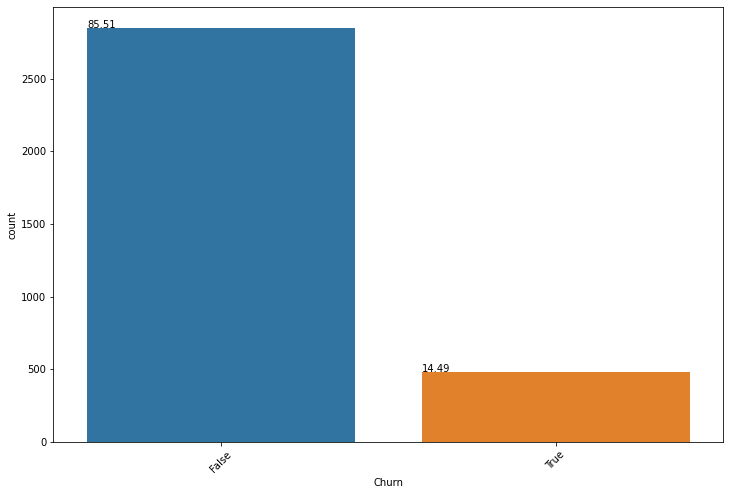

In [141]:
plt.figure(figsize=(12,8))
ax=sns.countplot(x='Churn',data=df)
for p in ax.patches:
    x=(p.get_height()/len(df['Churn']))*100
    ax.annotate((round(x,2)), (p.get_x(), p.get_height()))
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.show()

## States

WV    106
MN     84
NY     83
AL     80
OR     78
OH     78
WI     78
WY     77
VA     77
CT     74
MI     73
VT     73
ID     73
TX     72
UT     72
IN     71
MD     70
KS     70
NJ     68
NC     68
MT     68
WA     66
CO     66
NV     66
MS     65
MA     65
RI     65
AZ     64
FL     63
MO     63
ND     62
ME     62
NM     62
OK     61
NE     61
DE     61
SD     60
SC     60
KY     59
IL     58
NH     56
AR     55
DC     54
GA     54
HI     53
TN     53
AK     52
LA     51
PA     45
IA     44
CA     34
Name: State, dtype: int64


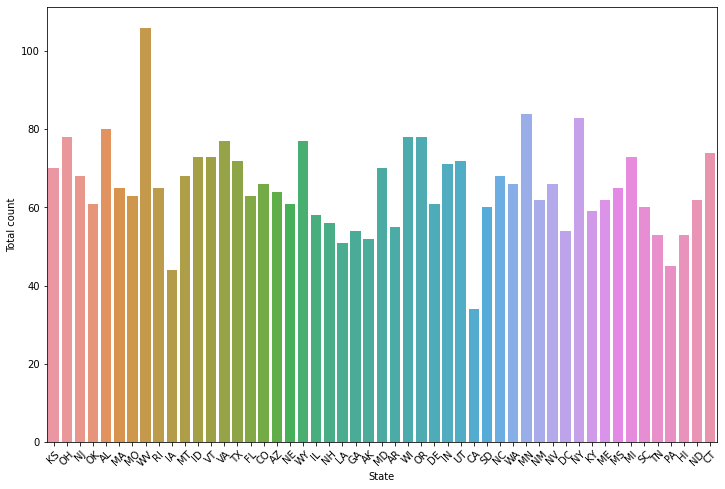

In [18]:
categorical_oversized('State')

## Area Code

415    1655
510     840
408     838
Name: Area code, dtype: int64


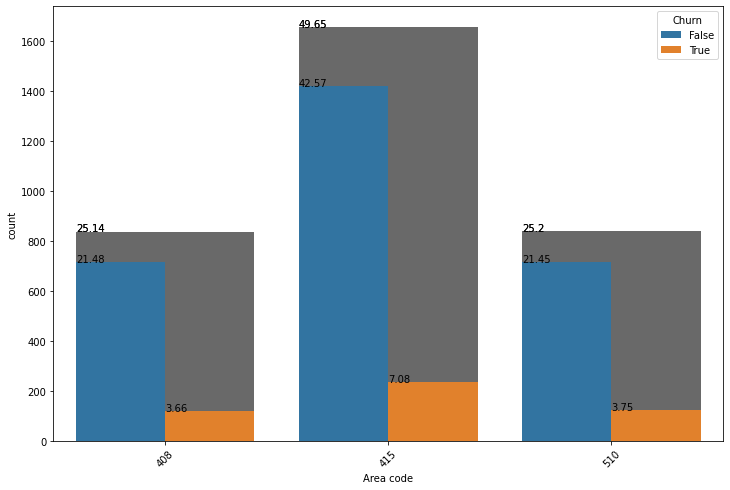

In [19]:
categorical('Area code')

## International Plan

No     3010
Yes     323
Name: International plan, dtype: int64


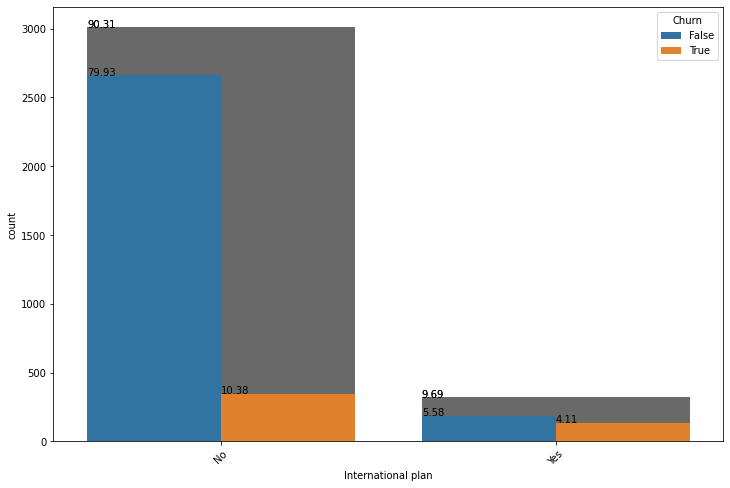

In [20]:
categorical('International plan')

## Voice Mail Plan

No     2411
Yes     922
Name: Voice mail plan, dtype: int64


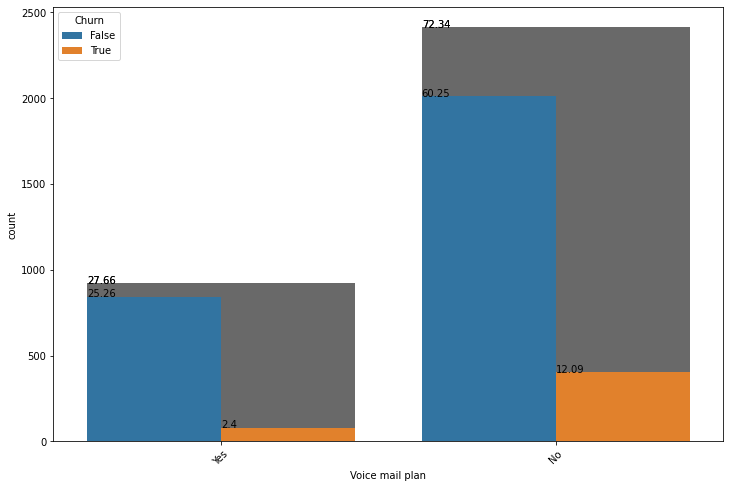

In [21]:
categorical('Voice mail plan')

## Number of Voice Mail Messages

count    3333.000000
mean        8.099010
std        13.688365
min         0.000000
25%         0.000000
50%         0.000000
75%        20.000000
max        51.000000
Name: Number vmail messages, dtype: float64


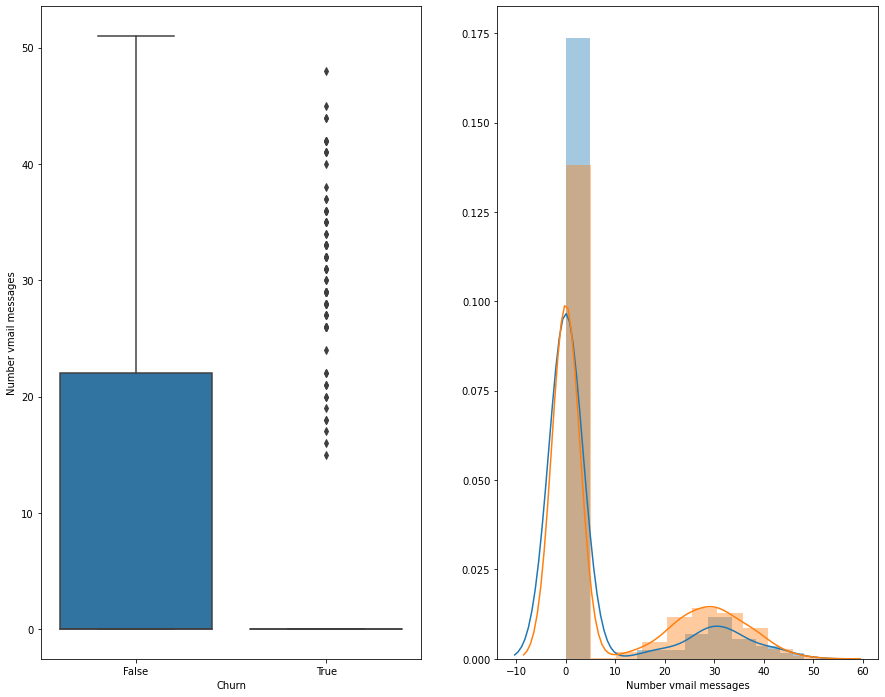

In [22]:
continuous('Number vmail messages')

## Customer Service Calls

count    3333.000000
mean        1.562856
std         1.315491
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         9.000000
Name: Customer service calls, dtype: float64


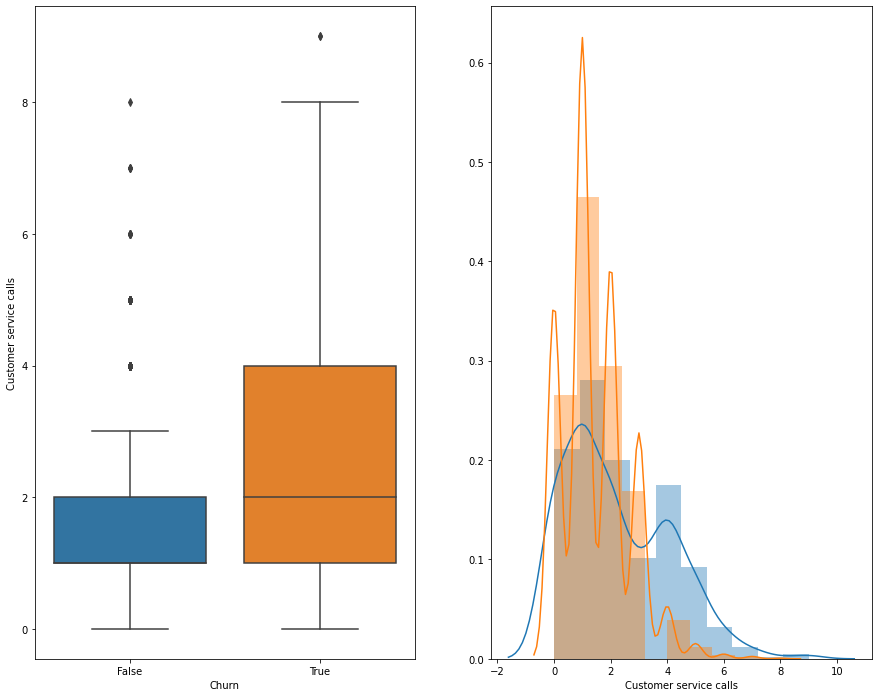

In [23]:
continuous('Customer service calls')

## Numerical data

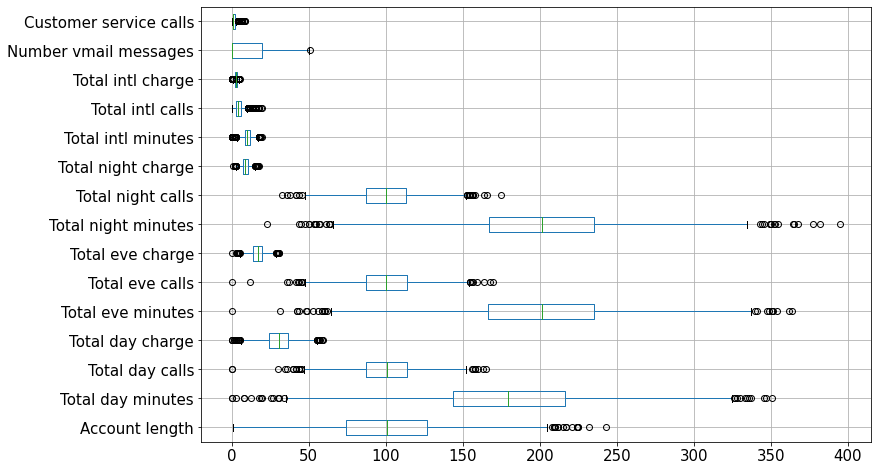

In [24]:
plt.figure(figsize=(12,8))
boxplot = df[numerical_columns].boxplot(vert=False,fontsize=15)

## Account Length (discrete)

count    3333.000000
mean      101.064806
std        39.822106
min         1.000000
25%        74.000000
50%       101.000000
75%       127.000000
max       243.000000
Name: Account length, dtype: float64


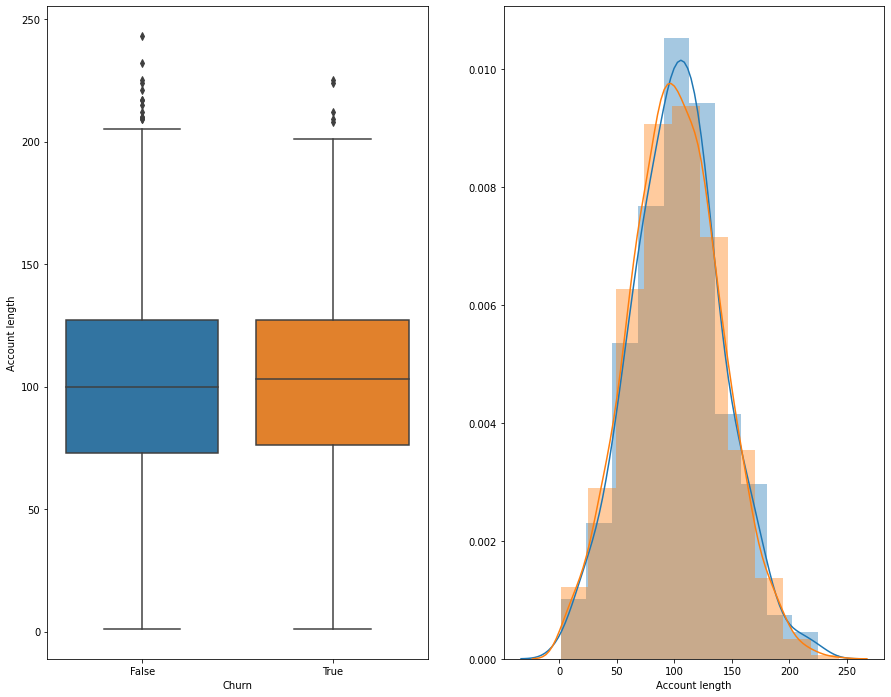

In [25]:
continuous('Account length')

## Total Day Minutes

count    3333.000000
mean      179.775098
std        54.467389
min         0.000000
25%       143.700000
50%       179.400000
75%       216.400000
max       350.800000
Name: Total day minutes, dtype: float64


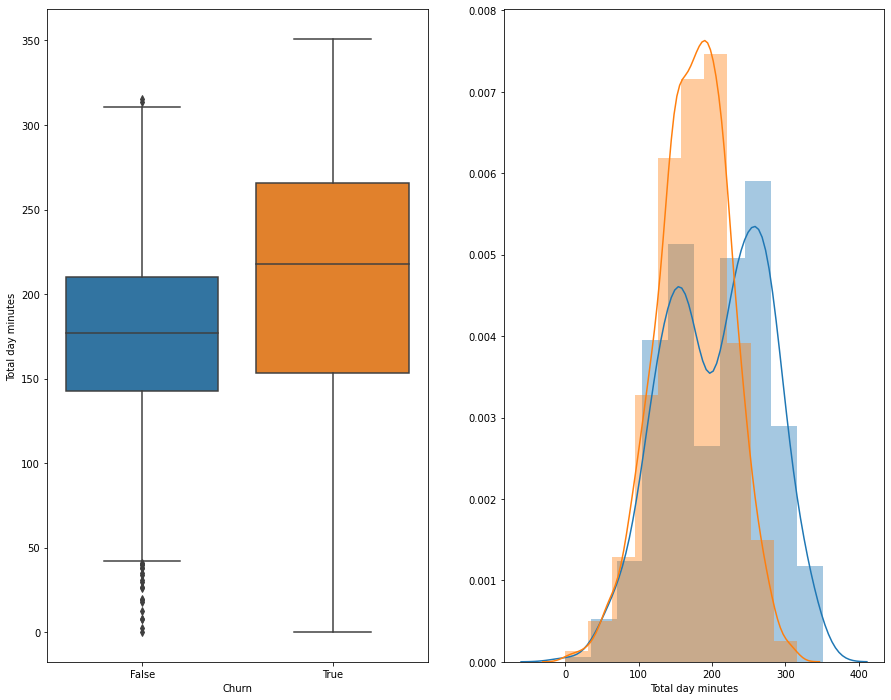

In [26]:
continuous('Total day minutes')

## Total day calls (discrete)

count    3333.000000
mean      100.435644
std        20.069084
min         0.000000
25%        87.000000
50%       101.000000
75%       114.000000
max       165.000000
Name: Total day calls, dtype: float64


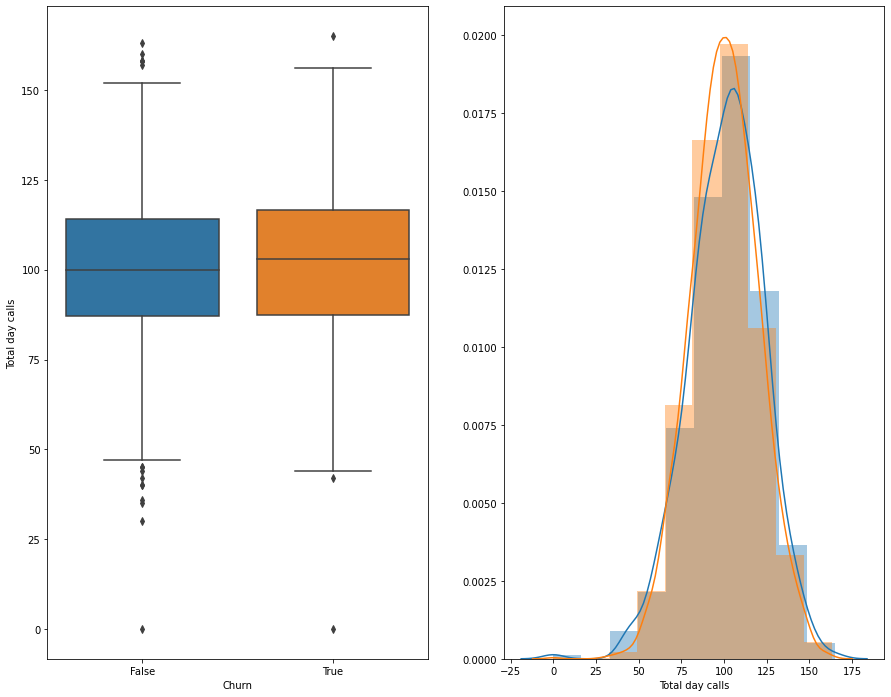

In [27]:
continuous('Total day calls')

## Total day charge

count    3333.000000
mean       30.562307
std         9.259435
min         0.000000
25%        24.430000
50%        30.500000
75%        36.790000
max        59.640000
Name: Total day charge, dtype: float64


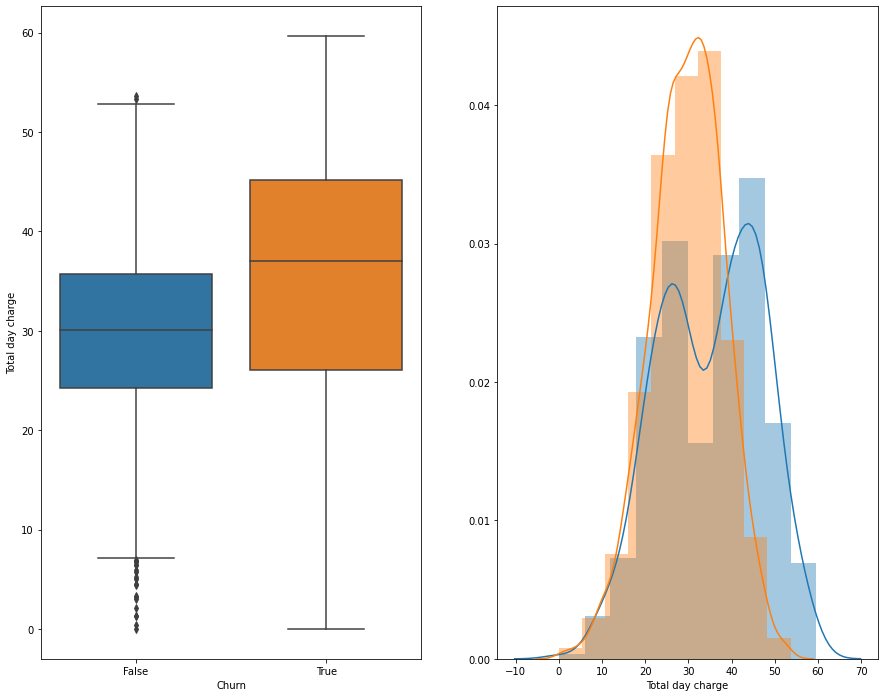

In [28]:
continuous('Total day charge')

## Total Eve minutes

count    3333.000000
mean      200.980348
std        50.713844
min         0.000000
25%       166.600000
50%       201.400000
75%       235.300000
max       363.700000
Name: Total eve minutes, dtype: float64


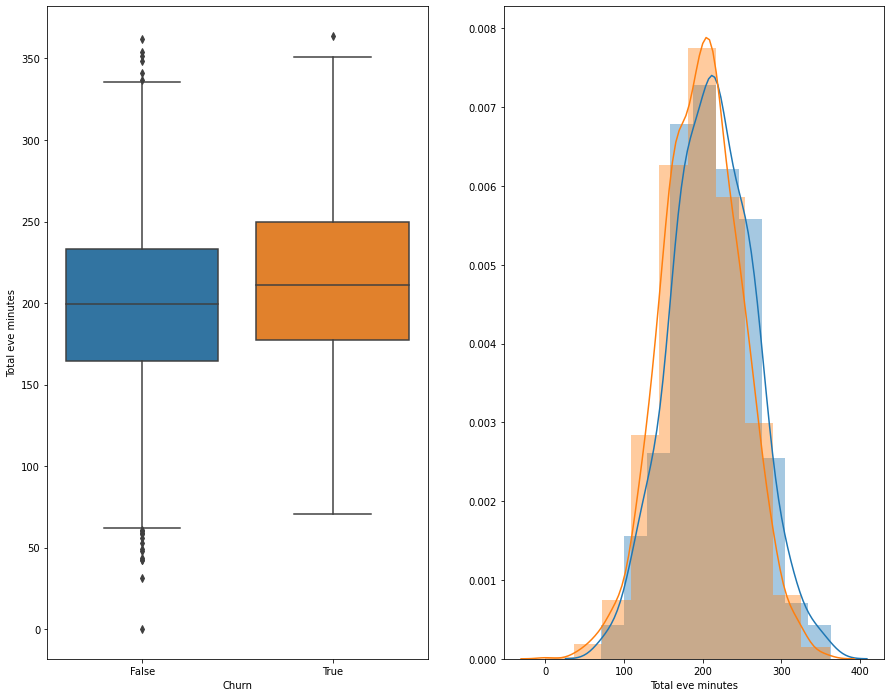

In [29]:
continuous('Total eve minutes')

## Total Eve calls (discrete)

count    3333.000000
mean      100.114311
std        19.922625
min         0.000000
25%        87.000000
50%       100.000000
75%       114.000000
max       170.000000
Name: Total eve calls, dtype: float64


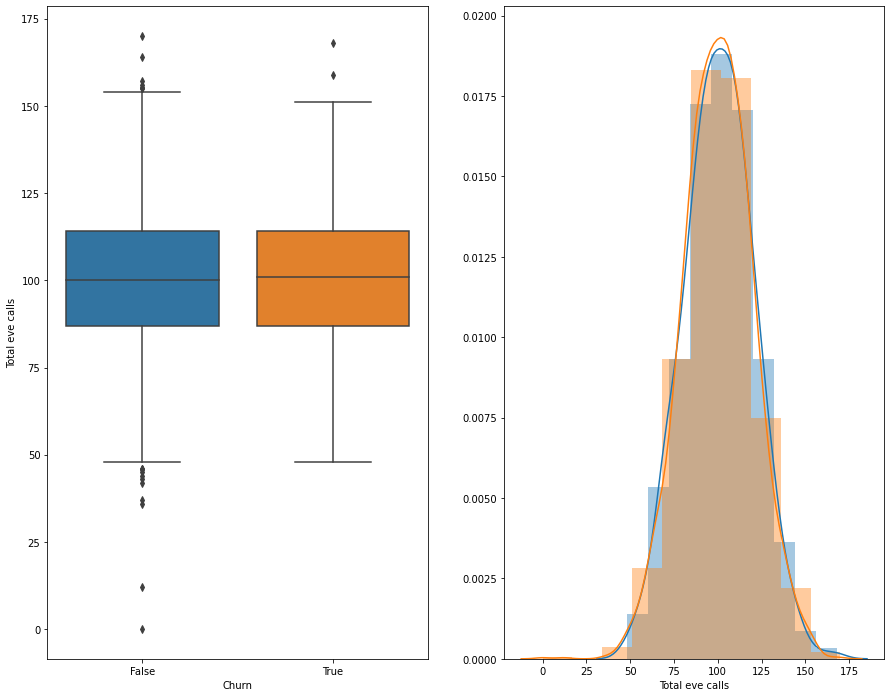

In [30]:
continuous('Total eve calls')

## Total eve charge

count    3333.000000
mean       17.083540
std         4.310668
min         0.000000
25%        14.160000
50%        17.120000
75%        20.000000
max        30.910000
Name: Total eve charge, dtype: float64


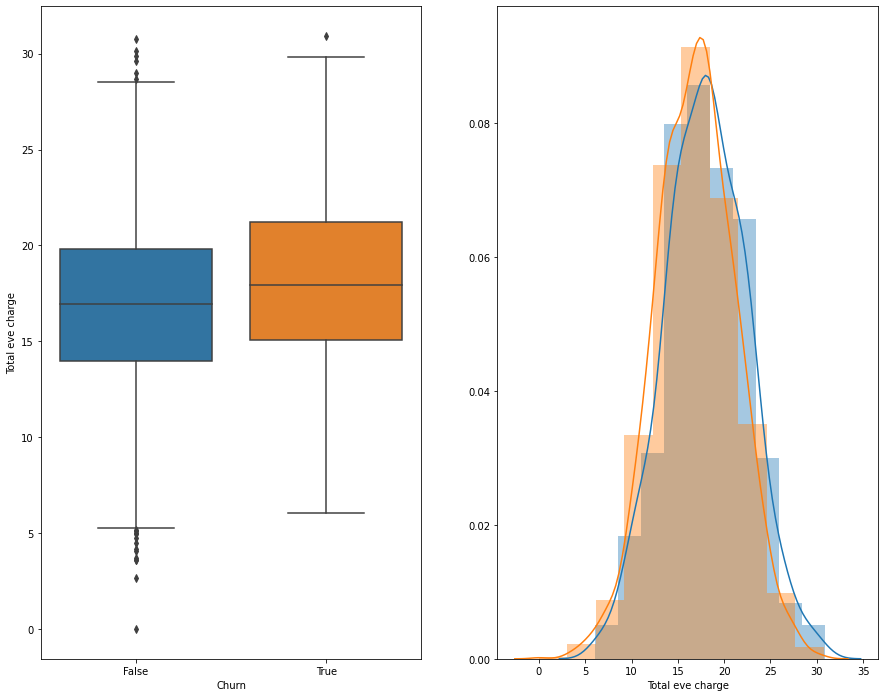

In [31]:
continuous('Total eve charge')

## Total night minutes

count    3333.000000
mean      200.872037
std        50.573847
min        23.200000
25%       167.000000
50%       201.200000
75%       235.300000
max       395.000000
Name: Total night minutes, dtype: float64


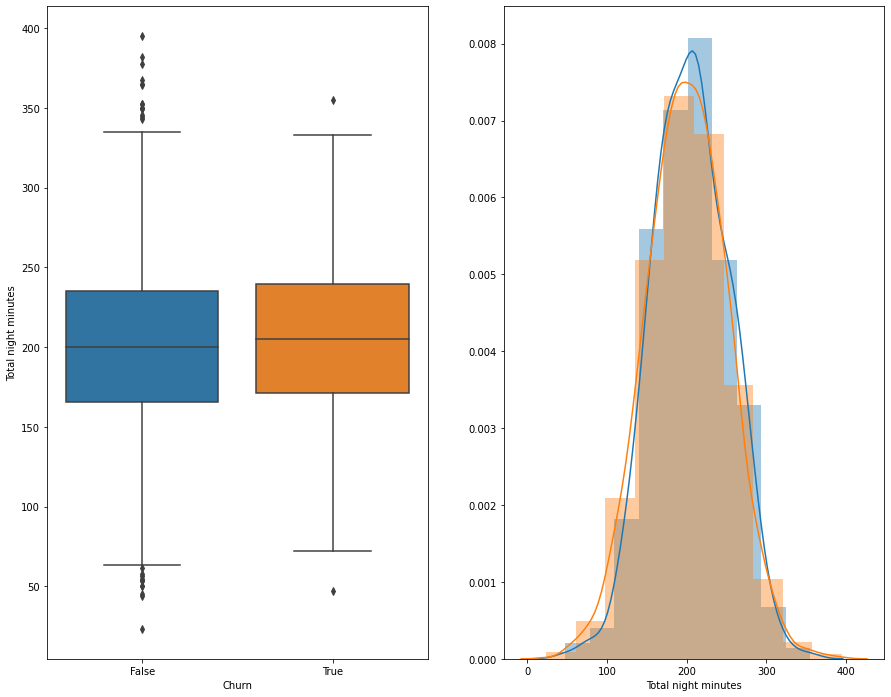

In [32]:
continuous('Total night minutes')

## Total night calls (discrete)

count    3333.000000
mean      100.107711
std        19.568609
min        33.000000
25%        87.000000
50%       100.000000
75%       113.000000
max       175.000000
Name: Total night calls, dtype: float64


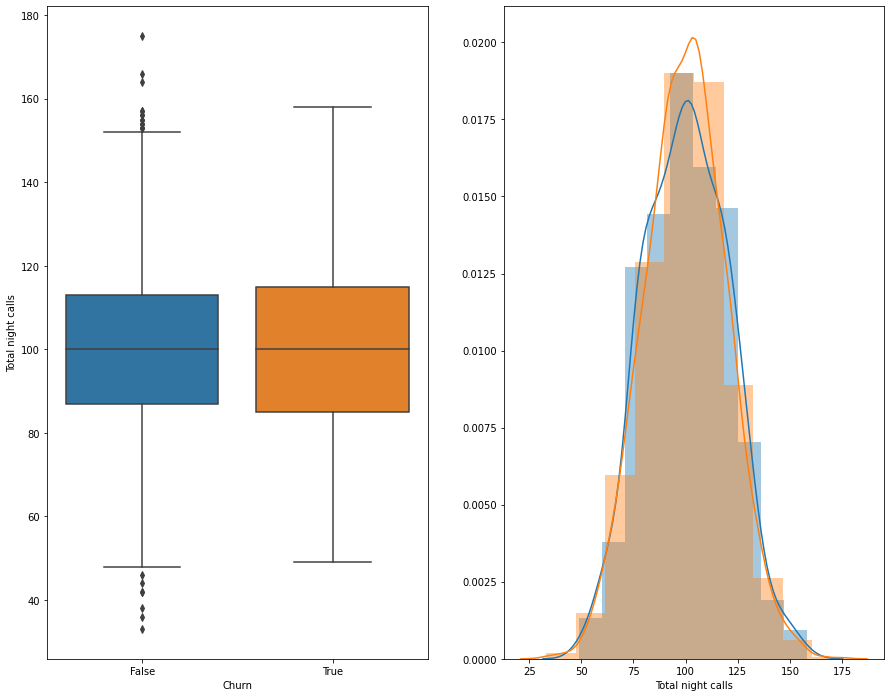

In [33]:
continuous('Total night calls')

## Total night charge

count    3333.000000
mean        9.039325
std         2.275873
min         1.040000
25%         7.520000
50%         9.050000
75%        10.590000
max        17.770000
Name: Total night charge, dtype: float64


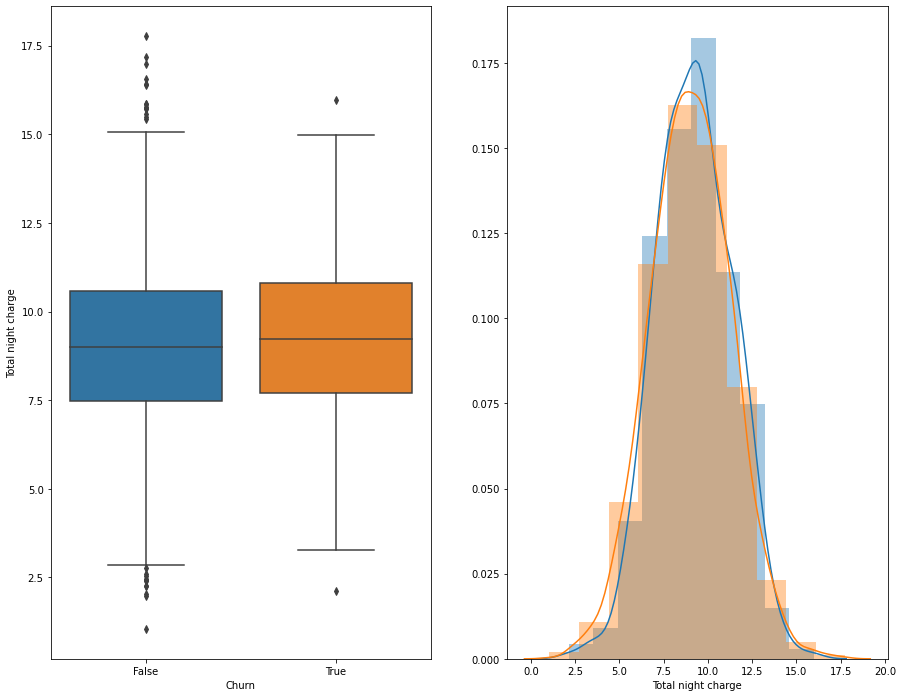

In [34]:
continuous('Total night charge')

## Total international minutes

count    3333.000000
mean       10.237294
std         2.791840
min         0.000000
25%         8.500000
50%        10.300000
75%        12.100000
max        20.000000
Name: Total intl minutes, dtype: float64


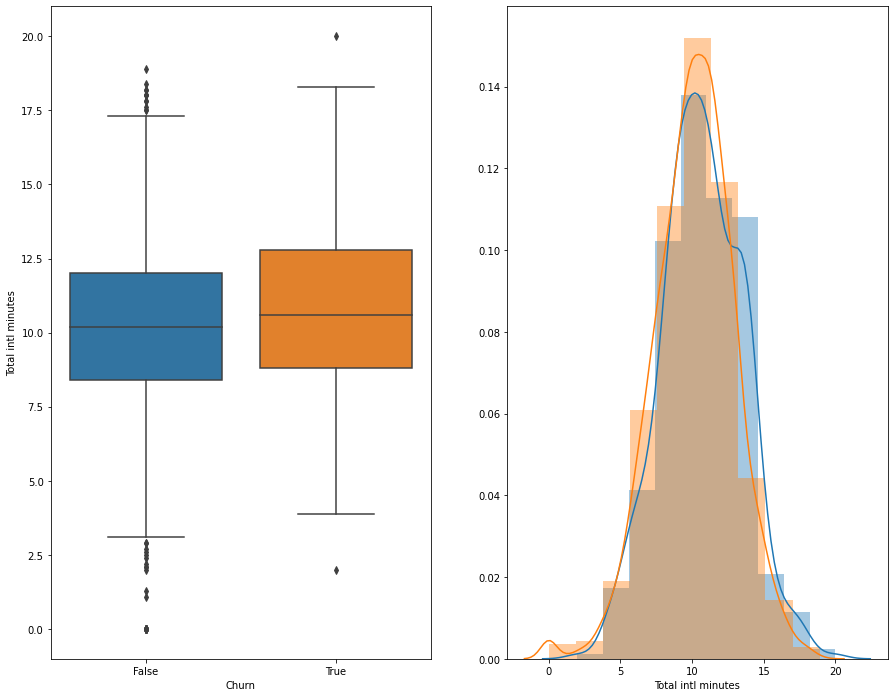

In [35]:
continuous('Total intl minutes')

## Total international calls (discrete)

count    3333.000000
mean        4.479448
std         2.461214
min         0.000000
25%         3.000000
50%         4.000000
75%         6.000000
max        20.000000
Name: Total intl calls, dtype: float64


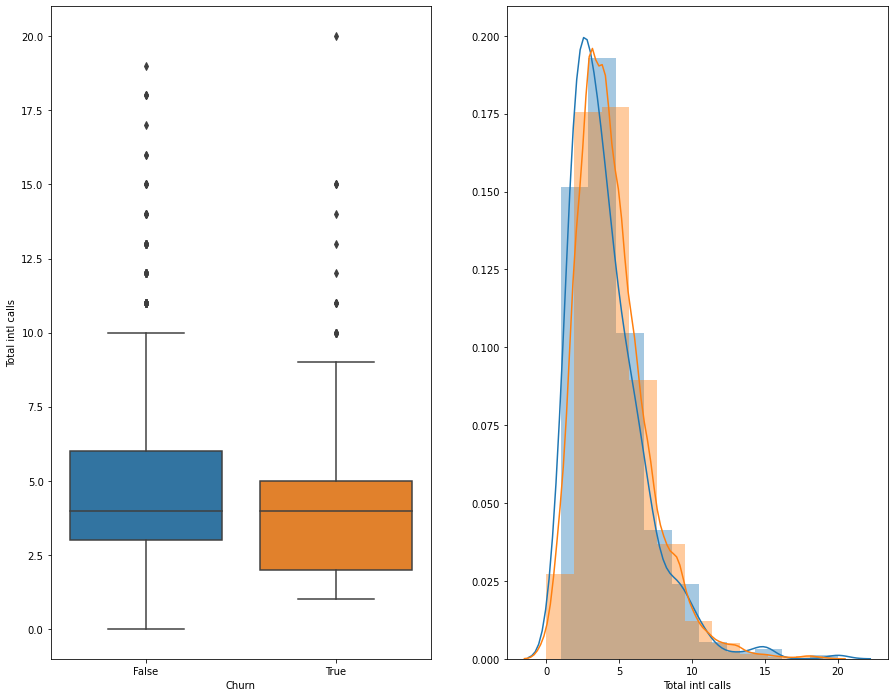

In [36]:
continuous('Total intl calls')

## Total International Charge

count    3333.000000
mean        2.764581
std         0.753773
min         0.000000
25%         2.300000
50%         2.780000
75%         3.270000
max         5.400000
Name: Total intl charge, dtype: float64


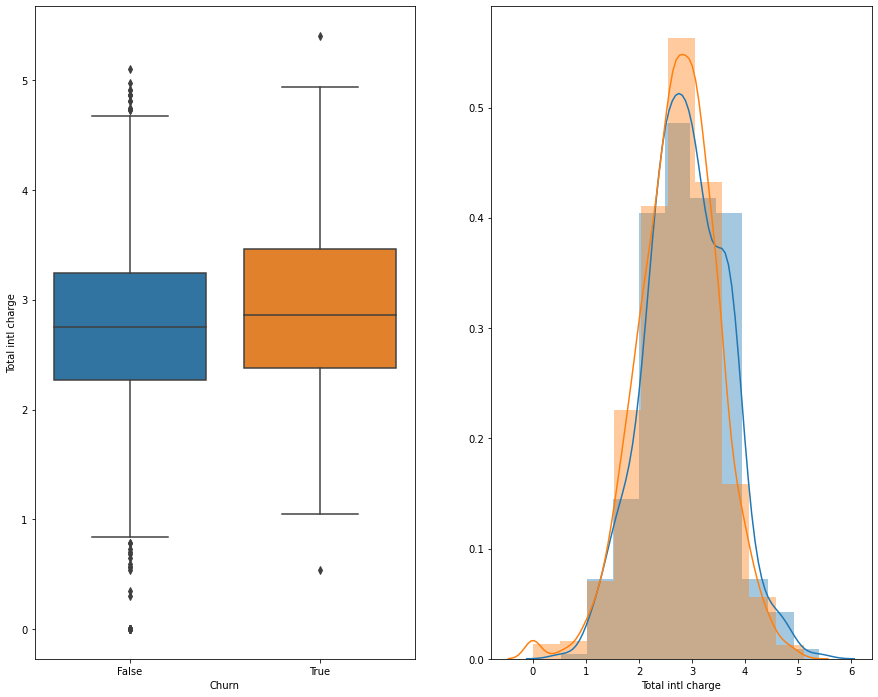

In [37]:
continuous('Total intl charge')

## Correlation Heatmap

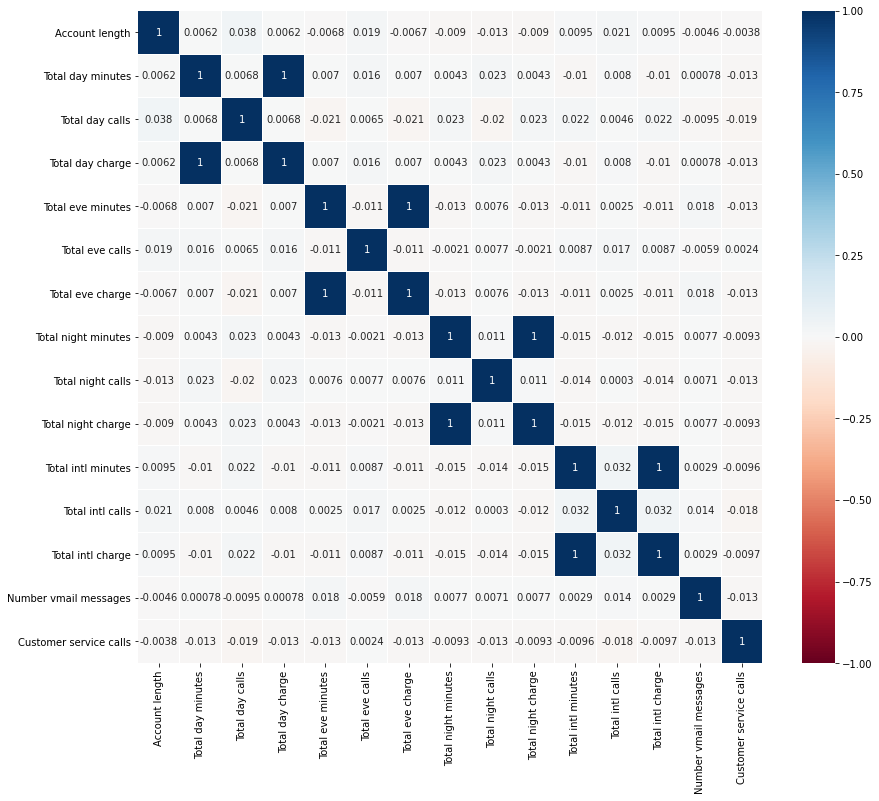

In [38]:
#create the correlation matrix heat map
plt.figure(figsize=(14,12))

sns.heatmap(df[numerical_columns].corr(),linewidths=.1,cmap="RdBu", annot=True,vmin=-1)

plt.yticks(rotation=0);


## Pair Plots

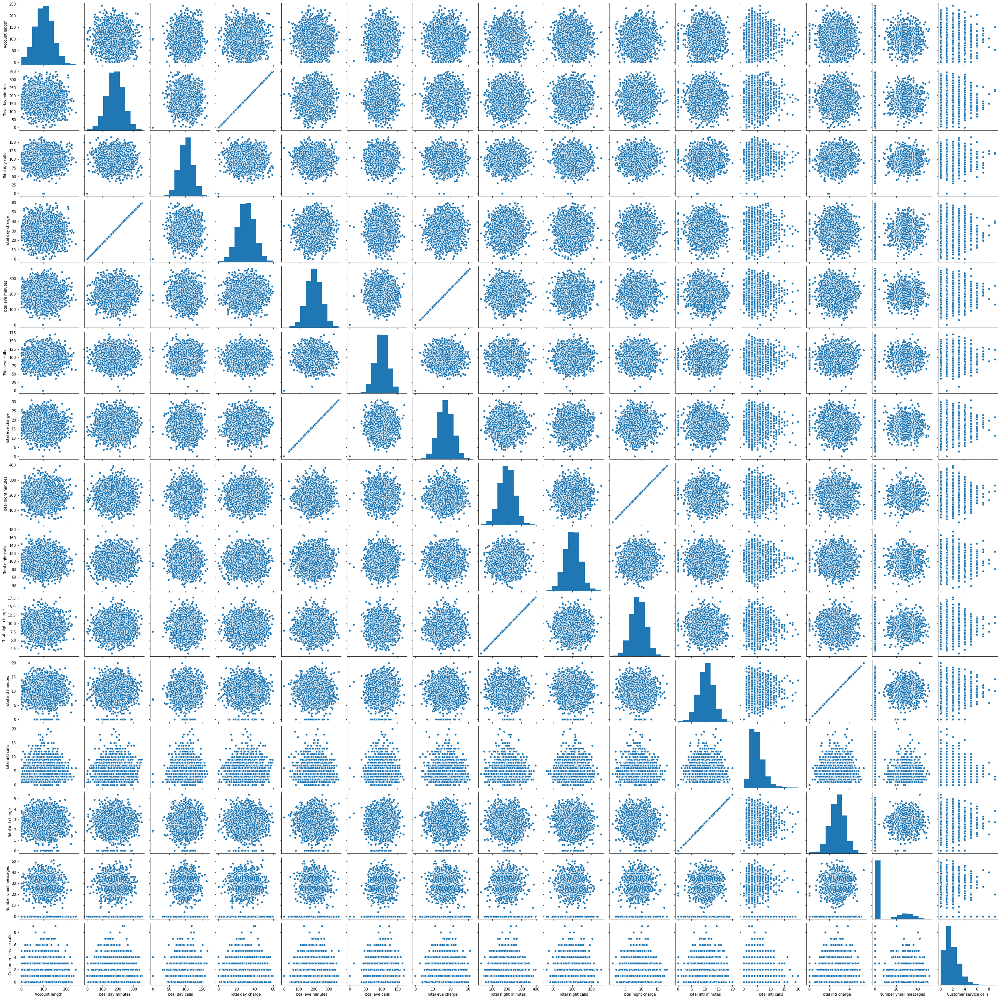

In [39]:
sns.pairplot(df[numerical_columns])

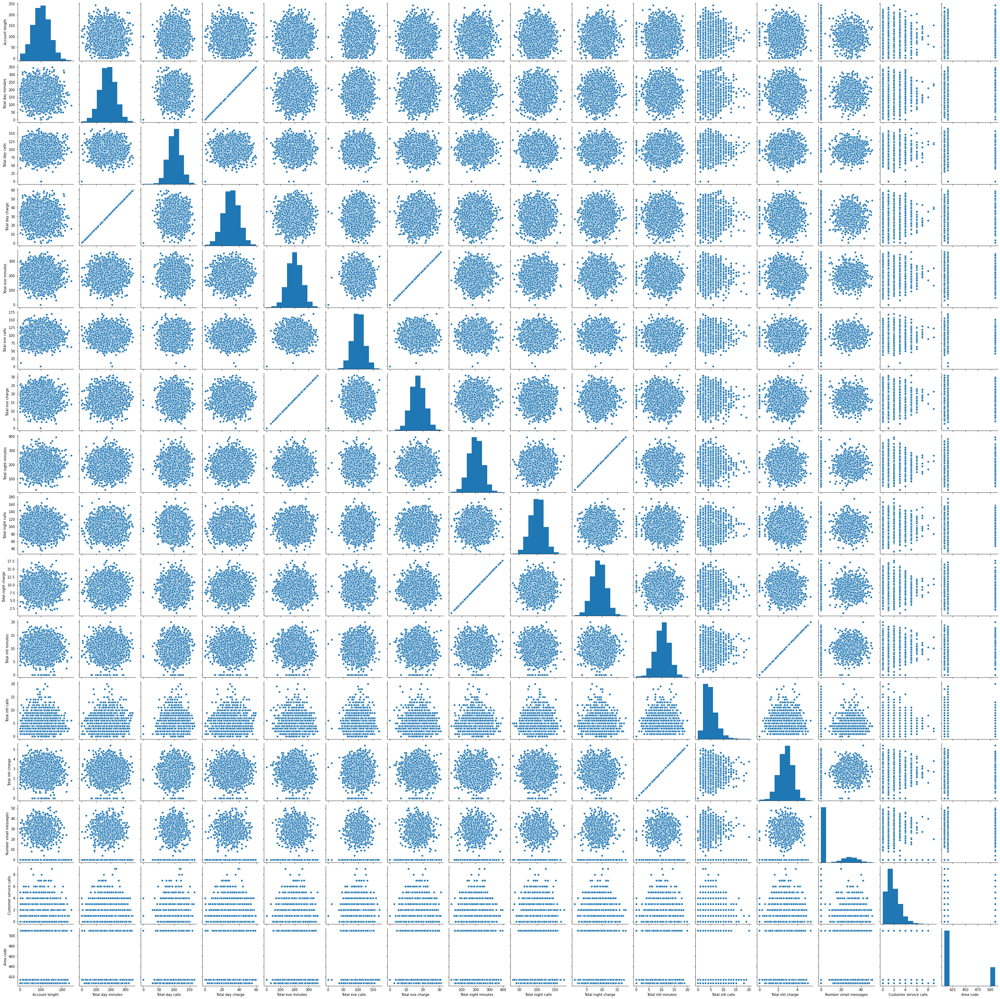

In [40]:
sns.pairplot(df[numerical_columns + categorical_columns])

## Data Processing

In [88]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

In [89]:
numerical_columns=['Account length',#discrete
           'Total day minutes',#continuous
           'Total day calls',#discrete
           'Total day charge',#continuous
           'Total eve minutes',#continuous
           'Total eve calls',#discrete
           'Total eve charge',#continuous
           'Total night minutes',#continuous
           'Total night calls',#discrete
           'Total night charge',#continuous
           'Total intl minutes',#continuous
           'Total intl calls',#discrete
           'Total intl charge',#contiuous
           'Number vmail messages', #discrete
           'Customer service calls' #discrete
          ]

categorical_columns2=['State',#nominal
                      'Area code' #nominal
                    ]

categorical_columns1=['International plan', #nominal
                      'Voice mail plan' #nominal
                     ]

target_column=['Churn'] #nominal
X=df[numerical_columns+categorical_columns1+ categorical_columns2]

In [79]:
#removed column
numerical_columns=['Account length',#discrete
           'Total day calls',#discrete
           'Total day charge',#continuous
           'Total eve calls',#discrete
           'Total eve charge',#continuous
           'Total night calls',#discrete
           'Total night charge',#continuous
           'Total intl calls',#discrete
           'Total intl charge',#contiuous
           'Customer service calls' #discrete
          ]

# categorical_columns2=['State',#nominal
#                       'Area code' #nominal
#                     ]

categorical_columns1=['International plan', #nominal
                      'Voice mail plan' #nominal
                     ]

target_column=['Churn'] #nominal
X=df[numerical_columns+categorical_columns1]

In [129]:
X_num=df[numerical_columns]

In [90]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Account length          3333 non-null   int64  
 1   Total day minutes       3333 non-null   float64
 2   Total day calls         3333 non-null   int64  
 3   Total day charge        3333 non-null   float64
 4   Total eve minutes       3333 non-null   float64
 5   Total eve calls         3333 non-null   int64  
 6   Total eve charge        3333 non-null   float64
 7   Total night minutes     3333 non-null   float64
 8   Total night calls       3333 non-null   int64  
 9   Total night charge      3333 non-null   float64
 10  Total intl minutes      3333 non-null   float64
 11  Total intl calls        3333 non-null   int64  
 12  Total intl charge       3333 non-null   float64
 13  Number vmail messages   3333 non-null   int64  
 14  Customer service calls  3333 non-null   

In [91]:
numeric_transformer=Pipeline(steps=[('scaler',StandardScaler())])
categorical_transfomer1=Pipeline(steps=[('onehot',OneHotEncoder(drop='first'))])
categorical_transfomer2=Pipeline(steps=[('onehot',OneHotEncoder(sparse=False))])

categorical_columns1=['International plan','Voice mail plan']
categorical_columns2=['State','Area code']

preprocessor=ColumnTransformer(transformers=[('numerical',numeric_transformer,numerical_columns),
                                             ('categorical1', categorical_transfomer1, categorical_columns1),
                                             ('categorical2', categorical_transfomer2, categorical_columns2)
                                            ])

In [92]:
preprocessor.fit(X)

ColumnTransformer(transformers=[('numerical',
                                 Pipeline(steps=[('scaler', StandardScaler())]),
                                 ['Account length', 'Total day minutes',
                                  'Total day calls', 'Total day charge',
                                  'Total eve minutes', 'Total eve calls',
                                  'Total eve charge', 'Total night minutes',
                                  'Total night calls', 'Total night charge',
                                  'Total intl minutes', 'Total intl calls',
                                  'Total intl charge', 'Number vmail messages',
                                  'Customer service calls']),
                                ('categorical1',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(drop='first'))]),
                                 ['International plan', 'Voice mail plan']),
             

In [93]:
df_pca_pipeline=Pipeline(steps=[('preprocessor',preprocessor),
                             ('pca',PCA(n_components=0.8))])
df_pca_pipeline.fit(X)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Account length',
                                                   'Total day minutes',
                                                   'Total day calls',
                                                   'Total day charge',
                                                   'Total eve minutes',
                                                   'Total eve calls',
                                                   'Total eve charge',
                                                   'Total night minutes',
                                                   'Total night calls',
                                                   'Total night charge',
                         

In [94]:
df_pca_pipeline[-1].explained_variance_ratio_

array([0.12110757, 0.12008314, 0.11771632, 0.11549149, 0.07036096,
       0.06280815, 0.06032522, 0.05954109, 0.05823823, 0.0573447 ])

In [74]:
def scree_plot(pca_object):
    assert isinstance(pca_object,PCA), "not pca object"
    ratio=pca_object.explained_variance_ratio_
    
    plt.figure(figsize=(12,8))
    x_value=['PC'+ str(number) for number in range(1, pca_object.n_components_+1)] 
    y_value=(100*ratio).round(1)
    
    plt.bar(x_value, y_value)

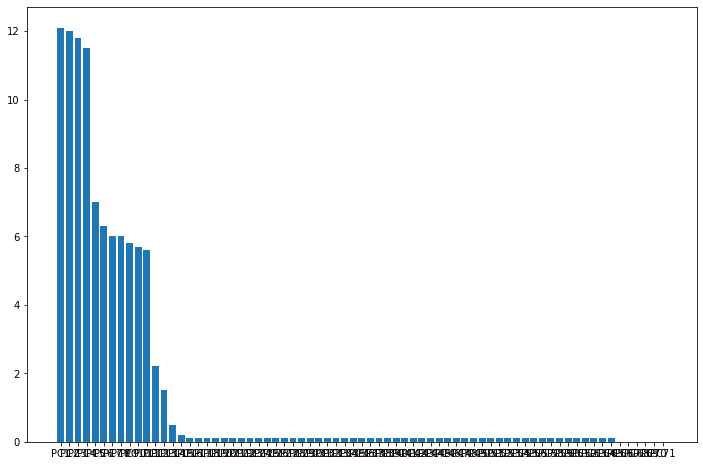

In [75]:
scree_plot(df_pca_pipeline[-1])

In [95]:
df_pca_pipeline=Pipeline(steps=[('preprocessor',preprocessor),
                             ('pca',PCA(n_components=.8))])
df_pca_pipeline.fit(X)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Account length',
                                                   'Total day minutes',
                                                   'Total day calls',
                                                   'Total day charge',
                                                   'Total eve minutes',
                                                   'Total eve calls',
                                                   'Total eve charge',
                                                   'Total night minutes',
                                                   'Total night calls',
                                                   'Total night charge',
                         

In [96]:
df_pca_pipeline[-1].singular_values_

array([82.57921842, 82.22921391, 81.41482124, 80.64178111, 62.94351571,
       59.46934243, 58.28202037, 57.90199373, 57.26499489, 56.82399714])

In [97]:
df_pca_pipeline[-1].components_

array([[-1.43226570e-02,  3.48274307e-01, -1.23567766e-02,
         3.48276995e-01,  2.02751756e-01, -4.06112773e-03,
         2.02748734e-01,  3.02235242e-01,  3.82228474e-02,
         3.02227807e-01, -4.94610301e-01, -3.15113128e-02,
        -4.94589197e-01,  1.16092657e-02, -1.00236854e-02,
        -3.12461273e-03,  5.88081805e-03, -1.37632288e-03,
        -1.78909536e-03, -3.83534680e-04, -4.12951070e-03,
         6.65437297e-04,  3.17874107e-04,  1.13751453e-03,
        -1.64789676e-03,  1.31876396e-04,  7.94697378e-04,
         4.51086344e-05, -2.72561259e-04,  6.60140884e-04,
        -1.53563669e-03, -1.58753268e-03,  4.48447328e-03,
        -2.02314133e-04, -2.49499998e-03,  2.08614149e-03,
         2.69439514e-03, -9.14029963e-04,  1.13920769e-03,
        -1.60176047e-03,  8.77923799e-04,  1.53162497e-04,
        -1.79800070e-03, -2.38690266e-03,  1.38657564e-03,
         3.14228468e-03, -1.06155949e-04,  5.93548028e-04,
         4.98611425e-04, -6.51335833e-04,  1.35497782e-0

## Kmeans

In [98]:
from sklearn.cluster import KMeans

In [99]:
kmeans_pipe=Pipeline(steps=[('preprocessor',preprocessor),
                            ('pca',PCA(n_components=.8)),
                            ('kmeans',KMeans(random_state=42,verbose=1))])

In [100]:
kmeans_pipe.fit(X)

Initialization complete
Iteration 0, inertia 40003.10930714187
Iteration 1, inertia 34836.11541427804
Iteration 2, inertia 33916.68276241483
Iteration 3, inertia 33515.54373933055
Iteration 4, inertia 33304.76986978526
Iteration 5, inertia 33193.064776082
Iteration 6, inertia 33128.28710425326
Iteration 7, inertia 33094.678605921305
Iteration 8, inertia 33077.12928553839
Iteration 9, inertia 33068.36136956451
Iteration 10, inertia 33063.80522860132
Iteration 11, inertia 33060.09430628455
Iteration 12, inertia 33054.87079876707
Iteration 13, inertia 33050.97468878381
Iteration 14, inertia 33047.64961601127
Iteration 15, inertia 33044.50142791245
Iteration 16, inertia 33040.71299910883
Iteration 17, inertia 33037.80552341941
Iteration 18, inertia 33034.92363502648
Iteration 19, inertia 33033.07733414096
Iteration 20, inertia 33030.93517045867
Iteration 21, inertia 33028.17852795189
Iteration 22, inertia 33025.145603554694
Iteration 23, inertia 33022.130040232776
Iteration 24, inertia 330

Iteration 6, inertia 33005.08911676333
Iteration 7, inertia 32920.01668172486
Iteration 8, inertia 32857.887010423816
Iteration 9, inertia 32816.99952576817
Iteration 10, inertia 32785.92126928391
Iteration 11, inertia 32760.27620610455
Iteration 12, inertia 32741.901827597383
Iteration 13, inertia 32728.832850608895
Iteration 14, inertia 32718.88531986897
Iteration 15, inertia 32712.847558322384
Iteration 16, inertia 32708.842978573965
Iteration 17, inertia 32705.508522505195
Iteration 18, inertia 32701.70436712692
Iteration 19, inertia 32699.901467573167
Iteration 20, inertia 32699.15318733235
Iteration 21, inertia 32698.508378581675
Iteration 22, inertia 32697.87963885767
Iteration 23, inertia 32697.383077705384
Iteration 24, inertia 32696.455900589033
Iteration 25, inertia 32696.132211858327
Iteration 26, inertia 32695.709601497307
Iteration 27, inertia 32695.562148359804
Iteration 28, inertia 32695.417570083115
Iteration 29, inertia 32695.183694359195
Iteration 30, inertia 32694.8

Iteration 13, inertia 33015.10982053131
Iteration 14, inertia 32993.24811499208
Iteration 15, inertia 32972.532143952994
Iteration 16, inertia 32957.14385373863
Iteration 17, inertia 32948.87851906264
Iteration 18, inertia 32945.32418028858
Iteration 19, inertia 32943.78911922439
Iteration 20, inertia 32940.573061975694
Iteration 21, inertia 32936.4917115622
Iteration 22, inertia 32930.11469713031
Iteration 23, inertia 32923.095597067324
Iteration 24, inertia 32917.596816940015
Iteration 25, inertia 32913.2629389497
Iteration 26, inertia 32907.9846091257
Iteration 27, inertia 32902.60310577943
Iteration 28, inertia 32897.66967409331
Iteration 29, inertia 32893.59935035243
Iteration 30, inertia 32890.22903777238
Iteration 31, inertia 32886.57498841516
Iteration 32, inertia 32884.366803295845
Iteration 33, inertia 32881.524851194314
Iteration 34, inertia 32879.01545107364
Iteration 35, inertia 32876.86466302535
Iteration 36, inertia 32874.36116060838
Iteration 37, inertia 32871.753867021

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Account length',
                                                   'Total day minutes',
                                                   'Total day calls',
                                                   'Total day charge',
                                                   'Total eve minutes',
                                                   'Total eve calls',
                                                   'Total eve charge',
                                                   'Total night minutes',
                                                   'Total night calls',
                                                   'Total night charge',
                         

In [101]:
kmeans_pipe.get_params()

{'memory': None,
 'steps': [('preprocessor',
   ColumnTransformer(transformers=[('numerical',
                                    Pipeline(steps=[('scaler', StandardScaler())]),
                                    ['Account length', 'Total day minutes',
                                     'Total day calls', 'Total day charge',
                                     'Total eve minutes', 'Total eve calls',
                                     'Total eve charge', 'Total night minutes',
                                     'Total night calls', 'Total night charge',
                                     'Total intl minutes', 'Total intl calls',
                                     'Total intl charge', 'Number vmail messages',
                                     'Customer service calls']),
                                   ('categorical1',
                                    Pipeline(steps=[('onehot',
                                                     OneHotEncoder(drop='first'))]),
      

In [102]:
kmeans_pipe.named_steps['kmeans'].cluster_centers_

array([[-5.94485383e-01,  9.57650381e-01,  3.29207518e-01,
        -1.51664177e+00, -4.50942712e-01,  1.04433856e-01,
         1.57912273e-01, -3.69261080e-03, -8.17464775e-02,
         8.63870947e-02],
       [-4.78110056e-01,  1.72439962e+00,  1.93564923e-01,
         1.18297199e+00, -6.06362578e-02,  1.09048703e-01,
        -1.35908538e-01, -1.05615533e-01,  7.90812312e-03,
        -2.38150897e-02],
       [ 1.87257129e+00,  3.76467192e-02,  9.43890984e-01,
         7.84322054e-01, -3.35443453e-01, -1.58548286e-02,
        -6.15088039e-02,  1.26895986e-02,  7.68145334e-02,
         1.66713766e-01],
       [-7.38805890e-01, -7.23289924e-01, -1.33133990e+00,
         1.15356440e+00, -2.63304496e-01,  1.06474531e-02,
         6.82206743e-02, -5.84082573e-02, -1.19909386e-01,
         5.03693517e-03],
       [ 2.46110049e-01, -1.81192588e+00,  1.91499301e-01,
        -8.67477096e-01, -5.00757678e-01, -6.78556005e-02,
         4.91357060e-02, -3.29688482e-01,  1.07902961e-01,
         9.

In [103]:
kmeans_pipe.named_steps['kmeans'].labels_

array([7, 0, 3, ..., 1, 0, 2], dtype=int32)

In [104]:
kmeans_pipe.named_steps['kmeans'].inertia_

32658.372044522024

In [105]:
kmeans_pipe.named_steps['kmeans'].n_iter_

43

In [106]:
inertia_list = []
for i in range(1,20):
    kmeans_pipe_xy = Pipeline(steps = [('preprocessor',preprocessor),
                                       ('pca',PCA(n_components=.8)),
                                       ('kmeans',KMeans(random_state = 42,
                                                  n_clusters = i))])
    kmeans_pipe_xy.fit(X)
    inertia_list.append(kmeans_pipe_xy.named_steps['kmeans'].inertia_)
inertia_list

[47468.61084008223,
 43082.35499070803,
 40078.44072873239,
 37766.04875420882,
 35923.20598423979,
 34494.827970955375,
 33488.54646281243,
 32658.37204844763,
 31841.35705527182,
 31189.23951295857,
 30577.92088025075,
 29915.46765755843,
 29401.459779103534,
 29011.296815952308,
 28509.43678696838,
 28170.775662106582,
 27776.070017434937,
 27468.392713167537,
 27121.08316681511]

In [111]:
kmeans_pca_pipe_final = Pipeline(steps = [('preprocessor',preprocessor),
                                          ('pca',PCA(n_components=.8)),
                                          ('kmeans',KMeans(n_clusters=3, random_state=42))])

In [112]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Account length          3333 non-null   int64  
 1   Total day minutes       3333 non-null   float64
 2   Total day calls         3333 non-null   int64  
 3   Total day charge        3333 non-null   float64
 4   Total eve minutes       3333 non-null   float64
 5   Total eve calls         3333 non-null   int64  
 6   Total eve charge        3333 non-null   float64
 7   Total night minutes     3333 non-null   float64
 8   Total night calls       3333 non-null   int64  
 9   Total night charge      3333 non-null   float64
 10  Total intl minutes      3333 non-null   float64
 11  Total intl calls        3333 non-null   int64  
 12  Total intl charge       3333 non-null   float64
 13  Number vmail messages   3333 non-null   int64  
 14  Customer service calls  3333 non-null   

In [113]:
kmeans_pca_pipe_final.fit(X)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Account length',
                                                   'Total day minutes',
                                                   'Total day calls',
                                                   'Total day charge',
                                                   'Total eve minutes',
                                                   'Total eve calls',
                                                   'Total eve charge',
                                                   'Total night minutes',
                                                   'Total night calls',
                                                   'Total night charge',
                         

In [114]:
kmeans_pca_pipe_final.named_steps['kmeans'].labels_

array([1, 2, 0, ..., 2, 2, 0], dtype=int32)

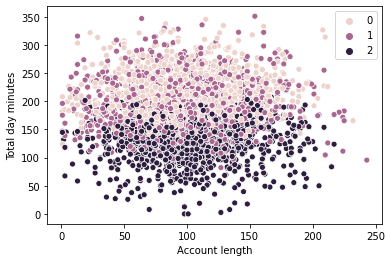

In [115]:
sns.scatterplot(X.iloc[:,0],X.iloc[:,1], hue =kmeans_pca_pipe_final.named_steps['kmeans'].labels_)


In [ ]:
#silhouette score

## DBSCAN with euclidean

In [116]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

In [118]:
dbscan_euclidean_pipe=Pipeline([('preprocessor',preprocessor),
                          ('pca',PCA(n_components=2)),
                          ('dbscan',DBSCAN())])

In [119]:
dbscan_euclidean_pipe.fit(X)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Account length',
                                                   'Total day minutes',
                                                   'Total day calls',
                                                   'Total day charge',
                                                   'Total eve minutes',
                                                   'Total eve calls',
                                                   'Total eve charge',
                                                   'Total night minutes',
                                                   'Total night calls',
                                                   'Total night charge',
                         

In [120]:
dbscan_euclidean_pipe[-1].labels_

array([0, 0, 0, ..., 0, 0, 0])

In [121]:
default_euclidean_labels=dbscan_euclidean_pipe[-1].labels_

In [155]:
silhouette_score(X[default_euclidean_labels!=-1],
                default_euclidean_labels[default_euclidean_labels !=-1],
                metric='euclidean')

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

In [122]:
X_scale_pca_euclidean=dbscan_euclidean_pipe[:-1].transform(X)

In [74]:
silhouette_score(X_scale_pca_euclidean[default_euclidean_labels!=-1],
                default_euclidean_labels[default_euclidean_labels !=-1],
                metric='euclidean')

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

Text(0.5, 1.0, 'DBSCAN with default parameters using PCA data')

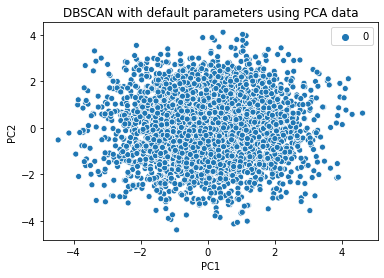

In [123]:
sns.scatterplot(X_scale_pca_euclidean[default_euclidean_labels !=-1,0],
                X_scale_pca_euclidean[default_euclidean_labels !=-1,1],
                hue= default_euclidean_labels[default_euclidean_labels!=-1])
plt.xlabel('PC1')
plt.ylabel('PC2')

plt.title('DBSCAN with default parameters using PCA data')

## DBSCAN with manhattan

In [124]:
dbscan_manhattan_pipe=Pipeline([('preprocessor',preprocessor),
                                ('pca',PCA(n_components=2)),
                                ('dbscan',DBSCAN(metric='manhattan'))])

In [125]:
dbscan_manhattan_pipe.fit(X)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Account length',
                                                   'Total day minutes',
                                                   'Total day calls',
                                                   'Total day charge',
                                                   'Total eve minutes',
                                                   'Total eve calls',
                                                   'Total eve charge',
                                                   'Total night minutes',
                                                   'Total night calls',
                                                   'Total night charge',
                         

In [126]:
default_manhattan_labels=dbscan_manhattan_pipe[-1].labels_

In [ ]:
silhouette_score(X[default_manhattan_labels!=-1],
                default_manhattan_labels[default_manhattan_labels !=-1],
                metric='manhattan')

In [127]:
X_scale_pca_manhattan=dbscan_manhattan_pipe[:-1].transform(X)

In [ ]:
silhouette_score(X_scale_pca_manhattan[default_manhattan_labels!=-1],
                default_manhattan_labels[default_manhattan_labels !=-1],
                metric='manhattan')

Text(0.5, 1.0, 'DBSCAN with manhattan parameters using PCA data')

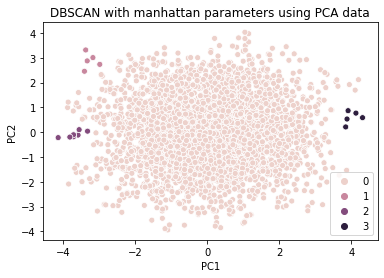

In [128]:
sns.scatterplot(X_scale_pca_manhattan[default_manhattan_labels !=-1,0],
                X_scale_pca_manhattan[default_manhattan_labels !=-1,1],
                hue= default_manhattan_labels[default_manhattan_labels!=-1])
plt.xlabel('PC1')
plt.ylabel('PC2')

plt.title('DBSCAN with manhattan parameters using PCA data')

## Hierachical Clustering

In [95]:
scaler=StandardScaler()
X_2=scaler.fit(X)

In [96]:
X_2_scale=scaler.transform(X)

/home/gamma/Desktop/unit3_project/unit3_env/lib/python3.6/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


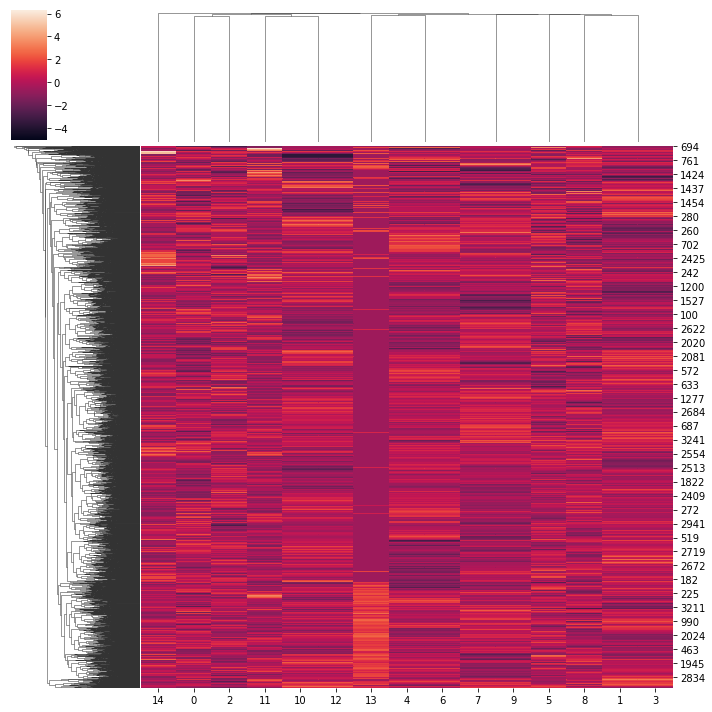

In [97]:
sns.clustermap(X_2_scale, metric='euclidean', method='average')

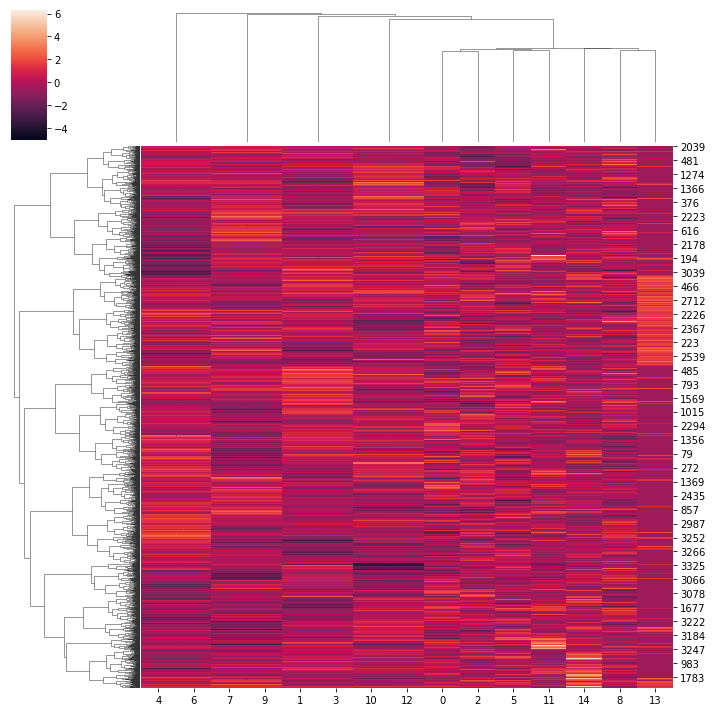

In [99]:
sns.clustermap(X_2_scale,metric='euclidean', method='ward')

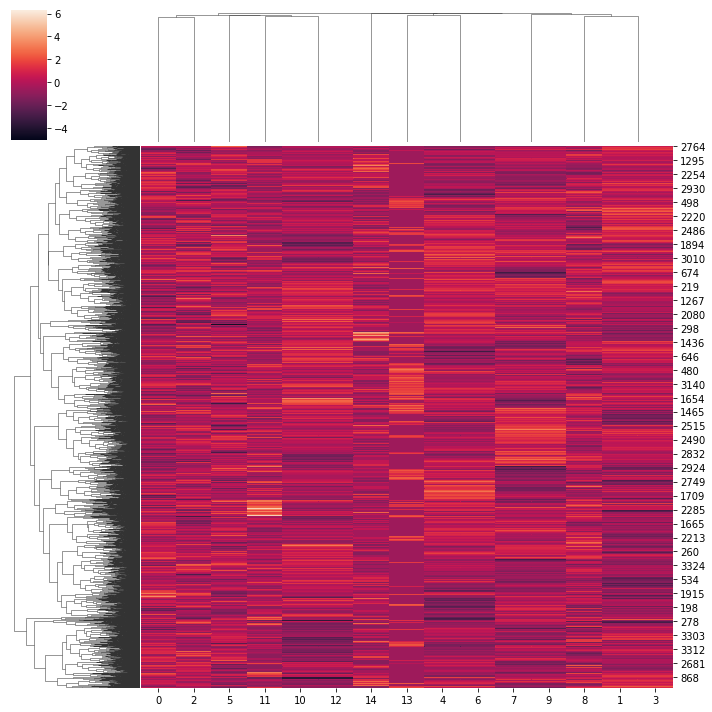

In [100]:
sns.clustermap(X_2_scale,metric='euclidean', method='complete')